# Visualising enriched kegg pathways

Lets draw the KEGG pathways that are enriched, and plot the methylation values for each cancer type (compared to normal)

In [68]:
# get the enriched pathway names
import pandas as pd
kegg_enriched_pathways = pd.read_csv('../kegg_enriched_pathways_multiclass.csv')
kegg_enriched_pathways


,Pathway_Name,Gene_Found,Gene_Pathway,Percentage,pvalue,pvalueAdj
1100,Metabolic pathways,190,1441,0.13,5.077158e-04,2.145099e-02
4144,Endocytosis,53,245,0.22,7.476420e-06,6.317575e-04
4310,Wnt signaling pathway,35,158,0.22,1.451839e-04,8.178694e-03
4350,TGF-beta signaling pathway,23,92,0.25,2.440700e-04,1.178509e-02
4360,Axon guidance,39,180,0.22,1.078204e-04,7.288661e-03
4390,Hippo signaling pathway,39,157,0.25,3.828871e-06,4.313861e-04
4550,Signaling pathways regulating pluripotency of ...,44,142,0.31,7.329327e-10,2.477313e-07
5200,Pathways in cancer,94,512,0.18,3.090637e-06,4.313861e-04
5224,Breast cancer,31,147,0.21,7.907105e-04,2.969557e-02


In [ ]:
from bioservices.kegg import KEGG
k = KEGG()
pws_to_get = {}
for pw_name in kegg_enriched_pathways['Pathway_Name']:
    kegg_pathway_id = k.lookfor_pathway(pw_name)
    kegg_pathway_id = kegg_pathway_id[0].split('path:')[1].split(' ')[0]
    kegg_pathway_id = kegg_pathway_id.replace('map', 'hsa') # make humna pathway
    pws_to_get[pw_name] = kegg_pathway_id
    
pd.DataFrame.from_dict(pws_to_get, orient='index')

print(list(pws_to_get.values()))
# now to download all of these using the R notebook

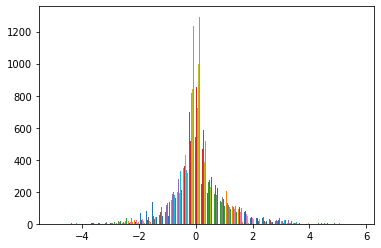

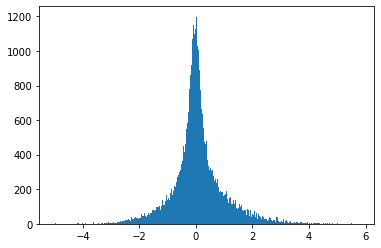

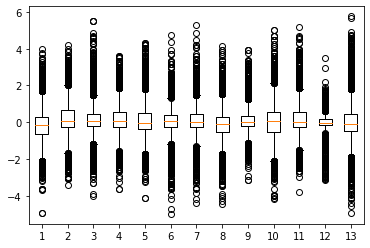

In [71]:
# now to get the methylation data for each gene
# we can get this from the hypo or hyper methylation heatmaps

methylation_diff_and_genes = pd.read_csv('../../hypo_or_hyper_methylation/methylation_difference_from_normal_and_mapped_genes_and_mutations.csv', index_col=0)

import ast
methylation_diff_and_genes['genes'] = methylation_diff_and_genes['genes'].map(ast.literal_eval) # turn back into list, solution from here: https://stackoverflow.com/a/18982942


# now explode the genes so we can map genes to methylation differences for each cancer type
methylation_diff_and_genes = methylation_diff_and_genes.explode('genes')
methylation_diff_and_genes = methylation_diff_and_genes[methylation_diff_and_genes['genes'].notnull()] # remove probes that don't map to any genes

# all methylation changes distribution for all cancer types
h = plt.hist(methylation_diff_and_genes.iloc[:,0:13], bins = 50)
plt.show()
h = plt.hist(methylation_diff_and_genes.iloc[:,0:13].values.flatten(), bins = 500)
plt.show()
# boxplots for each cancer type
bp = plt.boxplot(methylation_diff_and_genes.iloc[:,0:13])


In [72]:
# read in one enriched pathway
pid = 'hsa05200'
# pathway = pd.read_csv('hsa04360_pathway.csv')
pathway = pd.read_csv(pid + '_pathway.csv')

node_ids = pd.read_csv(pid + '_node_id_conversion.csv', index_col=0)
pathway
node_ids

,Unnamed: 0,source,target
0,1,ENSG00000187323,ENSG00000132906
1,2,ENSG00000187323,ENSG00000157500
2,3,ENSG00000164305,ENSG00000187323
3,4,ENSG00000132906,ENSG00000164305
4,5,ENSG00000132906,ENSG00000165806
...,...,...,...
1984,1985,ENSG00000135744,ENSG00000147145
1985,1986,ENSG00000135744,ENSG00000184574
1986,1987,ENSG00000135744,ENSG00000127533
1987,1988,ENSG00000135744,ENSG00000064547


,entrezgene_id,ensembl_gene_id,external_gene_name
1630.0,1630,ENSG00000187323,DCC
836.0,836,ENSG00000164305,CASP3
842.0,842,ENSG00000132906,CASP9
999.0,999,ENSG00000039068,CDH1
1499.0,1499,ENSG00000168036,CTNNB1
...,...,...,...
6778.0,6778,ENSG00000166888,STAT6
2147.0,2147,ENSG00000180210,F2
3827.0,3827,ENSG00000113889,KNG1
1906.0,1906,ENSG00000078401,EDN1


In [73]:
# lets put this into networkx and visualise this

import networkx as nx

def pathway_to_network(pathway, node_ids):
    graph = nx.DiGraph()

#     graph.add_nodes_from(node_ids['ensembl_gene_id'])
    nodes_to_add = node_ids.apply(lambda r: (r['ensembl_gene_id'], {'symbol': r['external_gene_name'], 'is_PCC_gene': r['external_gene_name'] in list(methylation_diff_and_genes['genes'])}), axis=1)
    graph.add_nodes_from(nodes_to_add)

    graph.add_edges_from(pathway.apply(lambda r: (r['source'], r['target']), axis=1))

    to_remove = nx.isolates(graph)
    to_remove = list(to_remove)
    graph.remove_nodes_from(to_remove) # remove nodes that aren't connected
    
    return(graph)

graph = pathway_to_network(pathway, node_ids)
graph

# save graph
nx.write_graphml(graph, pid + '.graphml')


In [74]:
# now for each node, get a colour representing the methylation difference from normal for a specific cancer type
def get_met_change(gene, cancer_type):
    met_changes = methylation_diff_and_genes[methylation_diff_and_genes['genes'] == gene][cancer_type]
    met_changes = list(met_changes) 
    
    # now we could take the mean, or the value at the absolute max
    # this can change, lets take the absolute max for now
    # the mean could just dilute out the interesting differential probes with the other probes that don't change as much
    import numpy as np
    abs_max_pos = np.argmax(np.abs(met_changes))
    met_change = met_changes[abs_max_pos]
    
    return(met_change)

# get_met_change('RNF135', cancer_type)



In [75]:
# iterates a number of times and randomly moves coloured nodes that overlap, in the hope of stopping them overlapping
# very much heuristic!
def avoid_node_overlap(pos):
    
    coloured_pos = {node: pos for node, pos in pos.items() if node_symbols[node] in list(methylation_diff_and_genes['genes'])}
    # coloured_pos

    min_dist_away = 40

    for e in range(10):
        for node, p in coloured_pos.items():
            p_xs = [p[0] for p in coloured_pos.values()]
            p_ys = [p[1] for p in coloured_pos.values()]

            x_list = np.array(p_xs)
            close_xs = (x_list < (p[0] + min_dist_away)) & (x_list > (p[0] - min_dist_away))

            y_list = np.array(p_ys)
            close_ys = (y_list < (p[1] + min_dist_away)) & (x_list > (p[1] - min_dist_away))

            close_nodes = np.array(list(coloured_pos.keys()))[close_xs & close_ys]
            close_nodes = list(set(close_nodes).difference({node})) # remove self node
            if len(close_nodes) != 0:
                # randomly move the node and hope it gets out the way
                coloured_pos[node] = (p[0] + np.random.uniform(-min_dist_away/2, min_dist_away/2), p[1] + np.random.uniform(-min_dist_away/2, min_dist_away/2))

    # update pos for all new coloured_poss
    for node, p in coloured_pos.items():
        pos[node] = p 
        
    return(pos)

def get_node_posistions(graph):
    pos = nx.nx_pydot.graphviz_layout(graph)
    pos= avoid_node_overlap(pos)
    return(pos)

In [76]:

def get_node_colors(graph, cancer_type):
    node_colors = []
    for node in graph.nodes():
        symbol = node_symbols[node]
        if symbol in list(methylation_diff_and_genes['genes']):
            met_change = get_met_change(symbol, cancer_type)
            node_colors.append(met_change)
        else:
            node_colors.append(np.nan)

    return(node_colors)



In [78]:
cancer_type='KIRC'
import numpy as np
node_symbols = {node: node_ids[node_ids['ensembl_gene_id'] == node]['external_gene_name'].item() for node in list(graph.nodes)}

node_colors = get_node_colors(graph, cancer_type)

node_sizes = [50 if np.isnan(n) else 200 for n in node_colors] # big for nodes with colours


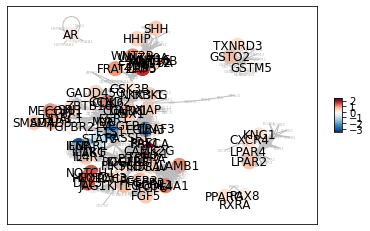

In [79]:
import matplotlib.pyplot as plt

def plot_pathway(graph, pos, node_colors, node_sizes, node_symbols):
#     f = plt.figure(figsize=(10, 10))

    cmap=plt.get_cmap('RdBu_r')

    nx.draw_networkx(graph, pos=pos, with_labels = False, node_color=node_colors, node_size=node_sizes, edge_color = '#bdbdbd', cmap=cmap, arrows=False)

    # change fontsize so it is smaller for nodes without a methylation colour:
    fontsize_dict = {node: 12 if node_symbols[node] in list(methylation_diff_and_genes['genes']) else 4 for node in graph.nodes()}
    fontcol_dict = {node: '#000000' if node_symbols[node] in list(methylation_diff_and_genes['genes']) else '#bdbdbd' for node in graph.nodes()}
    
    # first plot small nodes not in feature list
    for node, (x, y) in pos.items():
        if node_symbols[node] not in list(methylation_diff_and_genes['genes']):
            t = plt.text(x, y, node_symbols[node], fontsize=fontsize_dict[node], color=fontcol_dict[node], ha='center', va='center', fontfamily='sans-serif')
    # then plot big nodes that are features (plot these after so they are on top)
    for node, (x, y) in pos.items():
        if node_symbols[node] in list(methylation_diff_and_genes['genes']):
            t = plt.text(x, y, node_symbols[node], fontsize=fontsize_dict[node], color=fontcol_dict[node], ha='center', va='center', fontfamily='sans-serif')
    
    
    # drawing the colour bar:
    vmin = np.nanmin(node_colors)
    vmax = np.nanmax(node_colors)
    import matplotlib.colors as mcolors
    normalize = mcolors.TwoSlopeNorm(vcenter=0, vmin=vmin, vmax=vmax) # from: https://stackoverflow.com/a/68116628
#     normalize = plt.Normalize(vmin = vmin, vmax=vmax)
    cb = plt.cm.ScalarMappable(cmap=cmap, norm=normalize) # from: https://stackoverflow.com/a/26739882
    cb._A = []
    cb = plt.colorbar(cb, aspect=4, fraction = 0.025)
#     , ticks=np.linspace(np.round(vmin), np.round(vmax), 4))
#     cb.ax.set_xticklabels(np.linspace(np.round(vmin), np.round(vmax), 4))
#     ticklabels = np.linspace(vmin, vmax, 4)
#     cb.set_ticks(np.linspace(vmin, vmax, len(ticklabels)))
#     cb.set_ticklabels(ticklabels)


pos = get_node_posistions(graph)
plot_pathway(graph, pos, node_colors, node_sizes, node_symbols)



array([-2.7  , -1.725, -0.75 ,  0.225,  1.2  ])

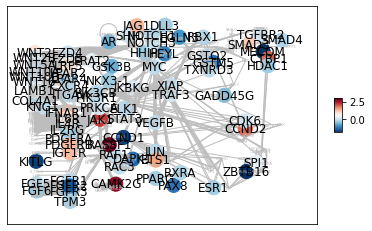

In [615]:
plot_pathway(graph, new_pos, node_colors, node_sizes, node_symbols)

80

386

9.3375

8.370466321243523

<AxesSubplot:xlabel='type', ylabel='degree'>

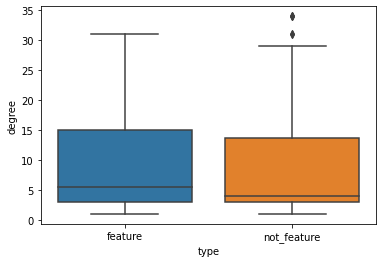

In [578]:
# is there a degree difference in feature nodes compared to not feature nodes?

degrees = dict(graph.degree())
# degrees


feature_node_degrees = [degrees[node] for node in degrees.keys() if node_symbols[node] in list(methylation_diff_and_genes['genes'])]
not_feature_node_degrees = [degrees[node] for node in degrees.keys() if node_symbols[node] not in list(methylation_diff_and_genes['genes'])]


len(feature_node_degrees)
len(not_feature_node_degrees)

np.mean(feature_node_degrees)
np.mean(not_feature_node_degrees)

to_plot = pd.DataFrame({'degree': feature_node_degrees, 'type': 'feature'}).append(pd.DataFrame({'degree': not_feature_node_degrees, 'type': 'not_feature'}))
import seaborn as sb
sb.boxplot(data = to_plot, x = 'type', y = 'degree') # doesn't seem like that much of a difference

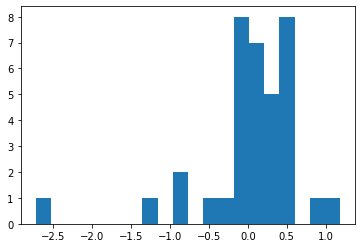

In [424]:
# distribution of plotted methylation differeence
h = plt.hist(node_colors, bins = 20)

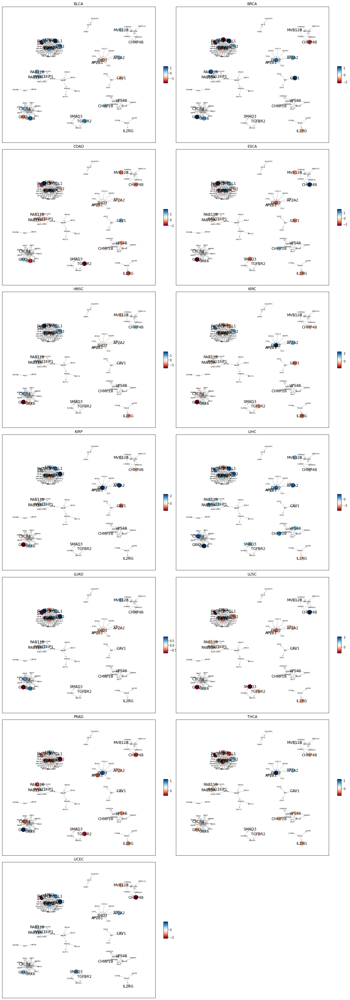

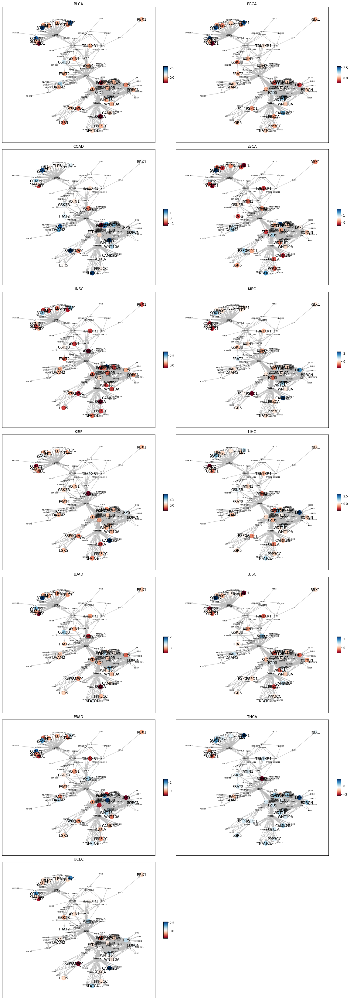

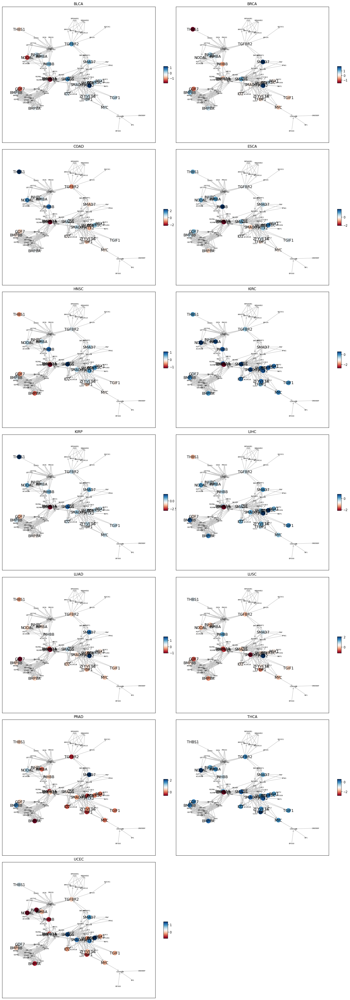

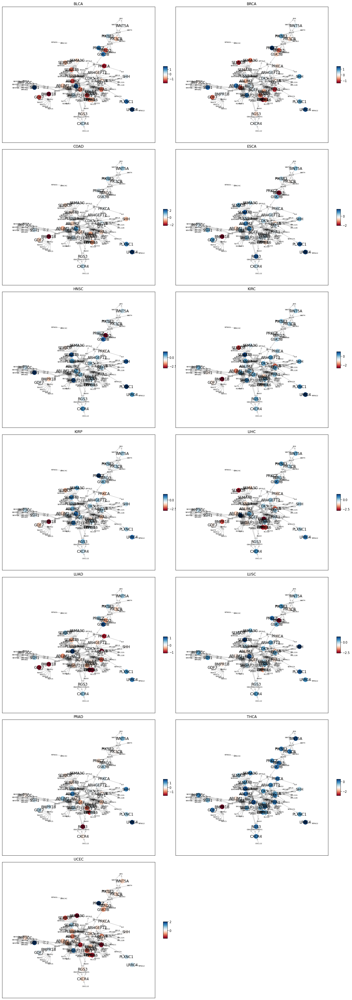

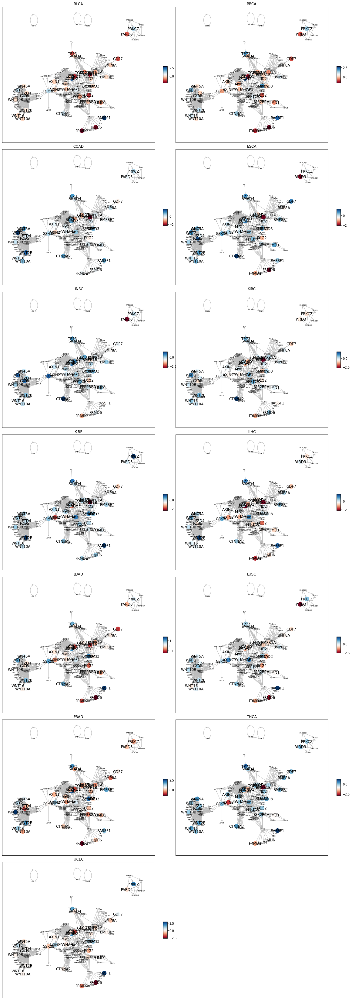

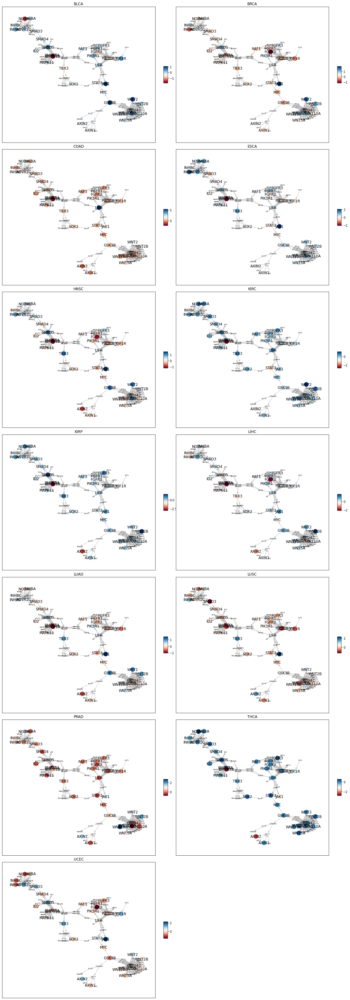

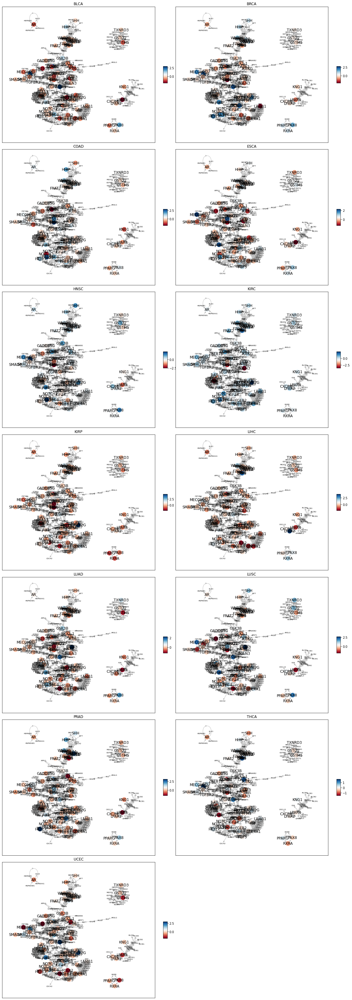

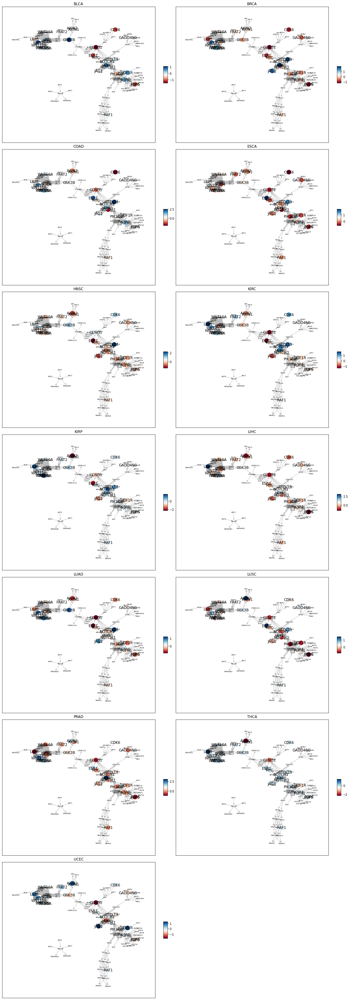

In [509]:
# Then plot each pathway one one page, multiple times for each cancer types = can compare met differences between cancers in specific pathways

# read in pathways
# pid = 'hsa04550'
# pid = 'hsa04310'
# pid = 'hsa04144'
# pid = 'hsa04360'
pids = ['hsa04144', 'hsa04310', 'hsa04350', 'hsa04360', 'hsa04390', 'hsa04550', 'hsa05200', 'hsa05224']
for pid in pids:
    pathway = pd.read_csv(pid + '_pathway.csv')
    node_ids = pd.read_csv(pid + '_node_id_conversion.csv', index_col=0)

    # put in networkx format
    graph = pathway_to_network(pathway, node_ids)


    fig = plt.figure(figsize=(20, 60))
    fig.subplots_adjust(hspace=0.05, wspace=0.05)

    # get gene symbols
    node_symbols = {node: node_ids[node_ids['ensembl_gene_id'] == node]['external_gene_name'].item() for node in list(graph.nodes)}

    # get positions of nodes (doing it now so same for all cancer types)
    pos = get_node_posistions(graph)

    cancer_types = ["BLCA", "BRCA", "COAD", "ESCA", "HNSC", "KIRC", "KIRP", "LIHC", "LUAD", "LUSC", "PRAD", "THCA", "UCEC"]
    for i, cancer_type in enumerate(cancer_types):

        # get node colours and sizes
        node_colors = get_node_colors(graph, cancer_type)
        node_sizes = [50 if np.isnan(n) else 200 for n in node_colors] # big for nodes with colours

        # plot
        sp = plt.subplot(7, 2, i+1)
        p = plot_pathway(graph, pos, node_colors, node_sizes, node_symbols)
        t = plt.title(cancer_type)

    plt.savefig('visualisations/' + pid + '_pathway_visualisations.pdf', bbox_inches='tight')

In [80]:
# read in hand-made positions (done in cytoscape)
import json
with open('hsa05200.cyjs', 'r') as f:
    new_pos = json.load(f)
    
new_pos = {n['data']['name']: (n['position']['x'], n['position']['y']) for n in new_pos['elements']['nodes']}


In [81]:
# we made this in cytoscape, where the y coordinate is the other way around
# so we swap all the y coords
new_pos = {k: (v[0], v[1]*-1) for k, v in new_pos.items()}

In [82]:
pid

'hsa05200'

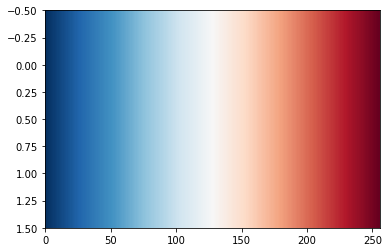

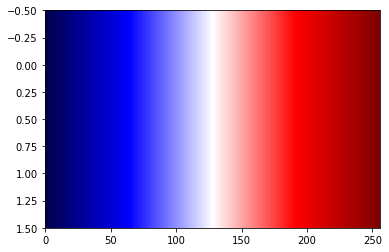

In [125]:
gradient = np.linspace(0, 1, 256)
gradient = np.vstack((gradient, gradient))
cmap=plt.get_cmap('RdBu_r')
plt.imshow(gradient, cmap=cmap, aspect='auto')
plt.show()
cmap=plt.get_cmap('seismic')
plt.imshow(gradient, cmap=cmap, aspect='auto')

In [126]:
# get max and min over all cancer types 
all_node_colors = []
cancer_types = ["BLCA", "BRCA", "COAD", "ESCA", "HNSC", "KIRC", "KIRP", "LIHC", "LUAD", "LUSC", "PRAD", "THCA", "UCEC"]
for i, cancer_type in enumerate(cancer_types):
    pathway = pd.read_csv(pid + '_pathway.csv')
    node_ids = pd.read_csv(pid + '_node_id_conversion.csv', index_col=0)

    # put in networkx format
    graph = pathway_to_network(pathway, node_ids)
    
    
    node_colors = get_node_colors(graph, cancer_type)
    all_node_colors.extend(node_colors)
    
max_col = np.nanmax(all_node_colors)
min_col = np.nanmin(all_node_colors)
max_col
min_col

# now create colour mapping over those min and maxes
import matplotlib.pyplot as plt
cmap=plt.get_cmap('RdBu_r')
cmap=plt.get_cmap('seismic')


vmin=min_col
vmax=max_col
import matplotlib.colors as mcolors
normalize = mcolors.TwoSlopeNorm(vcenter=0, vmin=vmin, vmax=vmax) # from: https://stackoverflow.com/a/68116628. This allows the middle colour (white) to be at 0
cb = plt.cm.ScalarMappable(cmap=cmap, norm=normalize) # from: https://stackoverflow.com/a/26739882
cb._A = []
mcolors.to_hex(cb.to_rgba(-0.5)) # given a colour in the range, returns the colour as a hex string

# cb = plt.colorbar(cb, aspect=4, fraction = 0.025)

4.490057764384494

-3.56258038018395

'#b9b9ff'

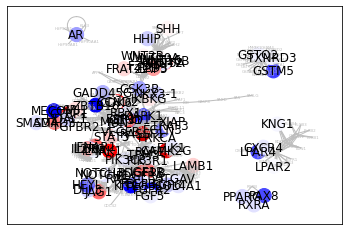

In [127]:
import matplotlib.pyplot as plt
# a slightly alternative version, where the colour map is given as a parameter
def plot_pathway_given_colour_mapping(graph, pos, node_colors, node_sizes, node_symbols, colour_map):
#     f = plt.figure(figsize=(10, 10))
    node_colors = [(0, 0, 0, 0) if np.isnan(nc) else colour_map.to_rgba(nc) for nc in node_colors] 

    nx.draw_networkx(graph, pos=pos, with_labels = False, node_color=node_colors, node_size=node_sizes, edge_color = '#bdbdbd', arrows=False)

    # change fontsize so it is smaller for nodes without a methylation colour:
    fontsize_dict = {node: 12 if node_symbols[node] in list(methylation_diff_and_genes['genes']) else 4 for node in graph.nodes()}
    fontcol_dict = {node: '#000000' if node_symbols[node] in list(methylation_diff_and_genes['genes']) else '#bdbdbd' for node in graph.nodes()}
    
    # first plot small nodes not in feature list
    for node, (x, y) in pos.items():
        if node_symbols[node] not in list(methylation_diff_and_genes['genes']):
            t = plt.text(x, y, node_symbols[node], fontsize=fontsize_dict[node], color=fontcol_dict[node], ha='center', va='center', fontfamily='sans-serif')
    # then plot big nodes that are features (plot these after so they are on top)
    for node, (x, y) in pos.items():
        if node_symbols[node] in list(methylation_diff_and_genes['genes']):
            t = plt.text(x, y, node_symbols[node], fontsize=fontsize_dict[node], color=fontcol_dict[node], ha='center', va='center', fontfamily='sans-serif')
    
    
    # drawing the colour bar:
#     col_bar = plt.colorbar(cb, aspect=4, fraction = 0.025)
#     vmin = np.nanmin(node_colors)
#     vmax = np.nanmax(node_colors)
#     import matplotlib.colors as mcolors
#     normalize = mcolors.TwoSlopeNorm(vcenter=0, vmin=vmin, vmax=vmax) # from: https://stackoverflow.com/a/68116628
#     normalize = plt.Normalize(vmin = vmin, vmax=vmax)
#     cb = plt.cm.ScalarMappable(cmap=cmap, norm=normalize) # from: https://stackoverflow.com/a/26739882
#     cb._A = []
#     cb = plt.colorbar(cb, aspect=4, fraction = 0.025)
#     , ticks=np.linspace(np.round(vmin), np.round(vmax), 4))
#     cb.ax.set_xticklabels(np.linspace(np.round(vmin), np.round(vmax), 4))
#     ticklabels = np.linspace(vmin, vmax, 4)
#     cb.set_ticks(np.linspace(vmin, vmax, len(ticklabels)))
#     cb.set_ticklabels(ticklabels)


pos = get_node_posistions(graph)
plot_pathway_given_colour_mapping(graph, pos, node_colors, node_sizes, node_symbols, cb)



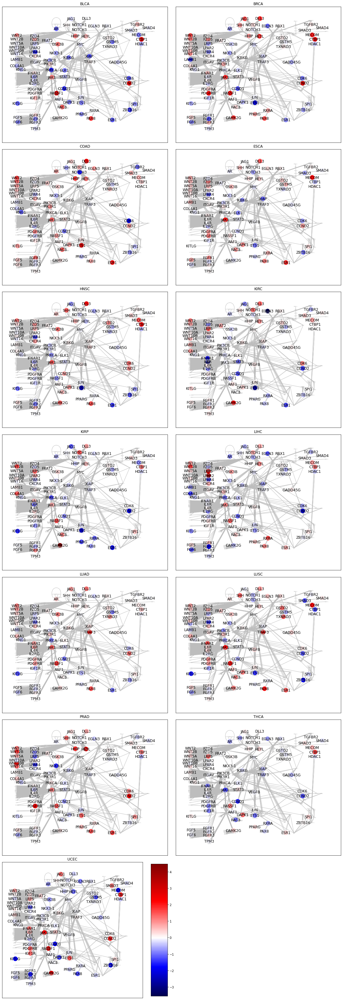

In [128]:
pathway = pd.read_csv(pid + '_pathway.csv')
node_ids = pd.read_csv(pid + '_node_id_conversion.csv', index_col=0)

# put in networkx format
graph = pathway_to_network(pathway, node_ids)


fig = plt.figure(figsize=(20, 60))
fig.subplots_adjust(hspace=0.05, wspace=0.05)

# get gene symbols
node_symbols = {node: node_ids[node_ids['ensembl_gene_id'] == node]['external_gene_name'].item() for node in list(graph.nodes)}


cancer_types = ["BLCA", "BRCA", "COAD", "ESCA", "HNSC", "KIRC", "KIRP", "LIHC", "LUAD", "LUSC", "PRAD", "THCA", "UCEC"]
for i, cancer_type in enumerate(cancer_types):

    # get node colours and sizes
    node_colors = get_node_colors(graph, cancer_type)
    node_sizes = [50 if np.isnan(n) else 200 for n in node_colors] # big for nodes with colours

    # plot
    sp = plt.subplot(7, 2, i+1)
#     p = plot_pathway(graph, new_pos, node_colors, node_sizes, node_symbols)
    p = plot_pathway_given_colour_mapping(graph, new_pos, node_colors, node_sizes, node_symbols, cb)

    t = plt.title(cancer_type)

col_bar = plt.colorbar(cb, aspect=8, fraction = 0.1)

plt.savefig('visualisations/' + pid + '_pathway_visualisations_hand_position.pdf', bbox_inches='tight')

In [643]:
methylation_diff_and_genes[methylation_diff_and_genes['genes'] == 'CAMK2G']

,BLCA,BRCA,COAD,ESCA,HNSC,KIRC,KIRP,LIHC,LUAD,LUSC,PRAD,THCA,UCEC,probe,genes,in_cosmic,in_SMG,mutated
54381,0.112575,1.886495,0.241301,-0.177934,1.420254,2.412248,4.490058,-0.462015,0.281644,1.113574,0.226743,0.403287,2.73338,cg04717534,CAMK2G,False,False,False


In [133]:
methylation_diff_and_genes.iloc[:,0:13].mean().sort_values() # which cancer types average methylation difference is most different?



BLCA   -0.134398
LIHC   -0.125344
THCA   -0.026386
UCEC    0.012394
KIRC    0.063500
LUSC    0.091201
LUAD    0.103036
KIRP    0.110411
HNSC    0.119589
BRCA    0.160585
ESCA    0.168472
COAD    0.202812
PRAD    0.212822
dtype: float64

In [134]:
methylation_diff_and_genes.iloc[:,0:13]

,BLCA,BRCA,COAD,ESCA,HNSC,KIRC,KIRP,LIHC,LUAD,LUSC,PRAD,THCA,UCEC
0,-1.052240,0.114285,-0.661201,0.221057,0.005234,0.823278,-0.240890,-0.210693,-0.193836,-0.007678,-0.057307,-0.848701,-0.543448
182422,1.167995,-0.202071,0.694957,0.154097,0.144970,0.040080,3.731935,0.559704,0.091731,0.015169,-0.265740,0.092871,1.462085
182427,0.229748,1.136125,2.859615,1.568559,1.156892,0.359885,0.253977,0.527622,0.487478,0.558771,1.127493,-0.127279,0.384178
182578,0.072823,0.369937,0.378900,0.128771,0.126614,0.214152,-0.097295,0.086766,0.323007,0.223672,-0.044570,0.072467,0.109490
182659,0.238070,-0.136548,-0.075312,-0.056607,-0.247816,-0.105066,0.105055,-0.615656,-0.036821,0.125201,-0.060916,0.128395,0.197455
...,...,...,...,...,...,...,...,...,...,...,...,...,...
85433,-0.424845,0.096665,0.209583,0.586105,1.024853,1.055995,0.663619,-0.403102,0.115889,0.124212,-0.177566,-0.164625,0.249895
85433,-0.424845,0.096665,0.209583,0.586105,1.024853,1.055995,0.663619,-0.403102,0.115889,0.124212,-0.177566,-0.164625,0.249895
85455,-0.376658,0.180397,2.526666,0.257310,-0.174408,0.099362,-0.276067,-0.157180,-0.122529,0.141569,-0.283717,-0.059926,-0.225524
85455,-0.376658,0.180397,2.526666,0.257310,-0.174408,0.099362,-0.276067,-0.157180,-0.122529,0.141569,-0.283717,-0.059926,-0.225524


In [138]:
av_cols = {}
for cancer_type in cancer_types:
    node_colors = get_node_colors(graph, cancer_type)
    av_cols[cancer_type] = np.nanmean(node_colors)

In [143]:
pd.DataFrame({'cancer':av_cols.keys(), 'mean':av_cols.values()}).sort_values('mean')

,cancer,mean
0,BLCA,-0.123319
11,THCA,-0.063545
5,KIRC,-0.061520
6,KIRP,-0.010170
12,UCEC,-0.006277
7,LIHC,0.020219
4,HNSC,0.098767
8,LUAD,0.135400
3,ESCA,0.164684
9,LUSC,0.199152
